## Config

In [1]:
# parameters
SAVE_OUTPUT = True
SIZE_PLOTS = (12,10)
BUFFER_SIZE = 402.336 
YEARS = [2017,2018,2019,2020,2021,2022,2023]

#Location of the data
INPUT_INTERIM_DATA_PATH = "../data/interim/"
OUTPUT_DATA_PATH = "../data/interim/"
MODEL_PATH = '../models/'


In [13]:
import numpy as np
import pandas as pd
import plotly.express as px
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

from prophet.diagnostics import cross_validation, performance_metrics

from joblib import dump, load

from pathlib import Path


## Load data

In [3]:
cunters_list = []
#for year in years, load the data in counters_data{year}.parquet
for year in YEARS:
    #Load the data
    counters_data = pd.read_parquet(f"{INPUT_INTERIM_DATA_PATH}cleaned_data{year}.parquet")
    counters_data = counters_data.rename(columns={'id':'Id_aforament'})
    counters_data["year"]=year

    #Append the data to the list
    cunters_list.append(counters_data)
    
observations = pd.concat(cunters_list)

## Data management

In [4]:
print(observations.shape)
print(observations.columns)
observations.head()


(8978712, 12)
Index(['Id_aforament', 'date', 'hour', 'intensity', 'prev_hour_count',
       'Daily_Counts', 'duration', 'Number_of_hrs_data_collected', 'day',
       'month', 'Number_of_days_data_collected', 'year'],
      dtype='object')


,Id_aforament,date,hour,intensity,prev_hour_count,Daily_Counts,duration,Number_of_hrs_data_collected,day,month,Number_of_days_data_collected,year
0,20003,2017-03-01,00,71,NaN,4615,1,24,1,3,22,2017
1,20003,2017-03-01,01,19,NaN,4615,1,24,1,3,22,2017
2,20003,2017-03-01,02,31,NaN,4615,1,24,1,3,22,2017
3,20003,2017-03-01,03,4,NaN,4615,1,24,1,3,22,2017
4,20003,2017-03-01,04,15,NaN,4615,1,24,1,3,22,2017


In [5]:
#Data in a format for prophet

observations['datetime'] = pd.to_datetime(observations['date'].astype(str) + ' ' + observations['hour'], format='%Y-%m-%d %H')


## Prophet

In [6]:
df = observations[['datetime', 'intensity']]
df = df.rename(columns={"datetime":"ds","intensity":"y"})

df.head()

,ds,y
0,2017-03-01 00:00:00,71
1,2017-03-01 01:00:00,19
2,2017-03-01 02:00:00,31
3,2017-03-01 03:00:00,4
4,2017-03-01 04:00:00,15


In [7]:
print(df.shape[0]/10)
# sample_data = df.sample(frac=0.90, random_state=42)  # 10% of data
sample_data=df

897871.2


### Make model

In [ ]:
# m = Prophet()
# m.fit(sample_data)

17:35:33 - cmdstanpy - INFO - Chain [1] start processing
18:58:36 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:


# # Save the model to a file
# model_path = 
# dump(m, f'{MODEL_PATH}prophet_model.joblib')

['../models/prophet_model.joblib']

### Load model

In [8]:
#Load the model
m = load(f'{MODEL_PATH}/prophet_model.joblib')


### Plot components

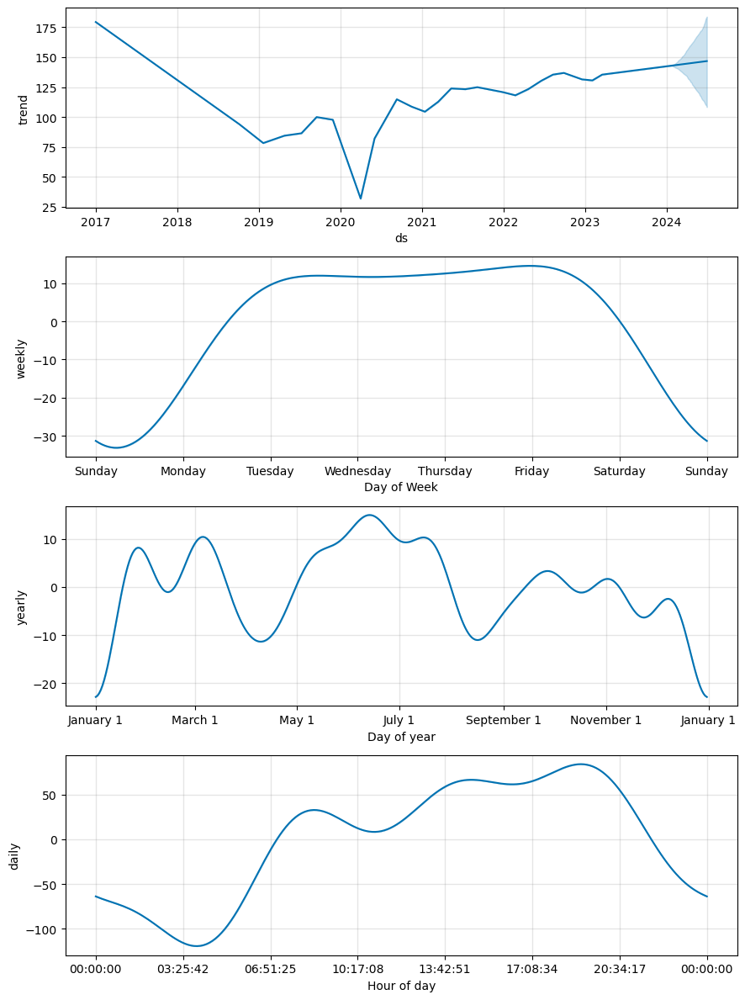

In [52]:
# Plot the components without the forecast for 2024
forecast = m.make_future_dataframe(periods=180)
forecast = m.predict(forecast)

# forecast_filtered = forecast[forecast['ds'].dt.year < 2024]

fig2 = m.plot_components(forecast)

In [53]:
fig2 = plot_components_plotly(m, forecast)
fig2.show()
# fig2.update_layout(
#     title="Prophet Components",
#     width=SIZE_PLOTS[0] * 100,
#     height=SIZE_PLOTS[1] * 100,
#     template="plotly_white"
# )

### Other

In [38]:
# Python
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
53208,2024-12-26 23:00:00
53209,2024-12-27 23:00:00
53210,2024-12-28 23:00:00
53211,2024-12-29 23:00:00
53212,2024-12-30 23:00:00


In [39]:
# Python
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
53208,2024-12-26 23:00:00,99.956394,-72.949640,290.021400
53209,2024-12-27 23:00:00,86.062750,-85.124260,283.952089
53210,2024-12-28 23:00:00,53.524916,-139.434423,231.597162
53211,2024-12-29 23:00:00,65.319976,-132.839309,255.912579
53212,2024-12-30 23:00:00,92.556547,-85.080827,283.149651


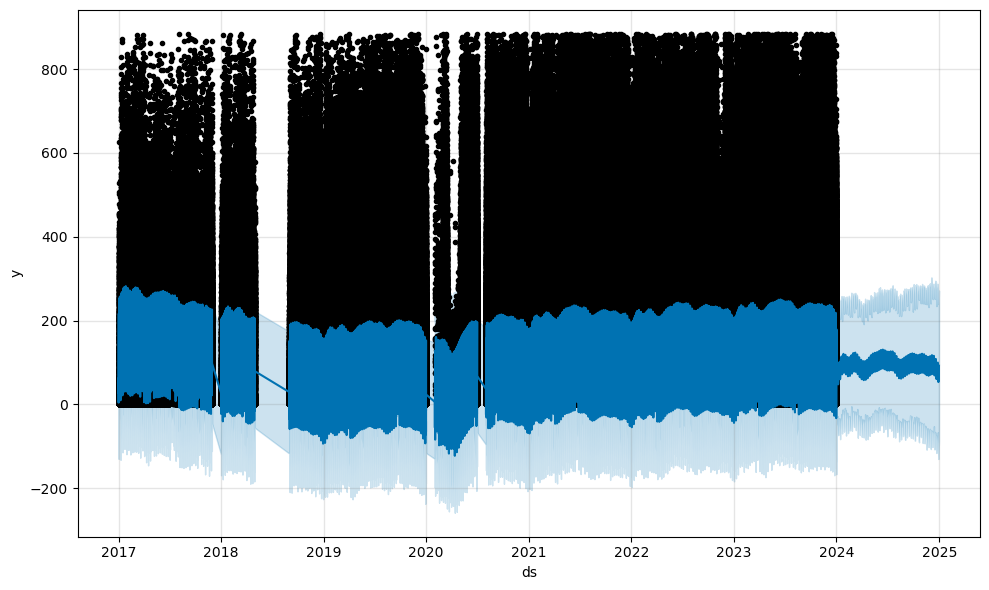

In [11]:
fig1 = m.plot(forecast)

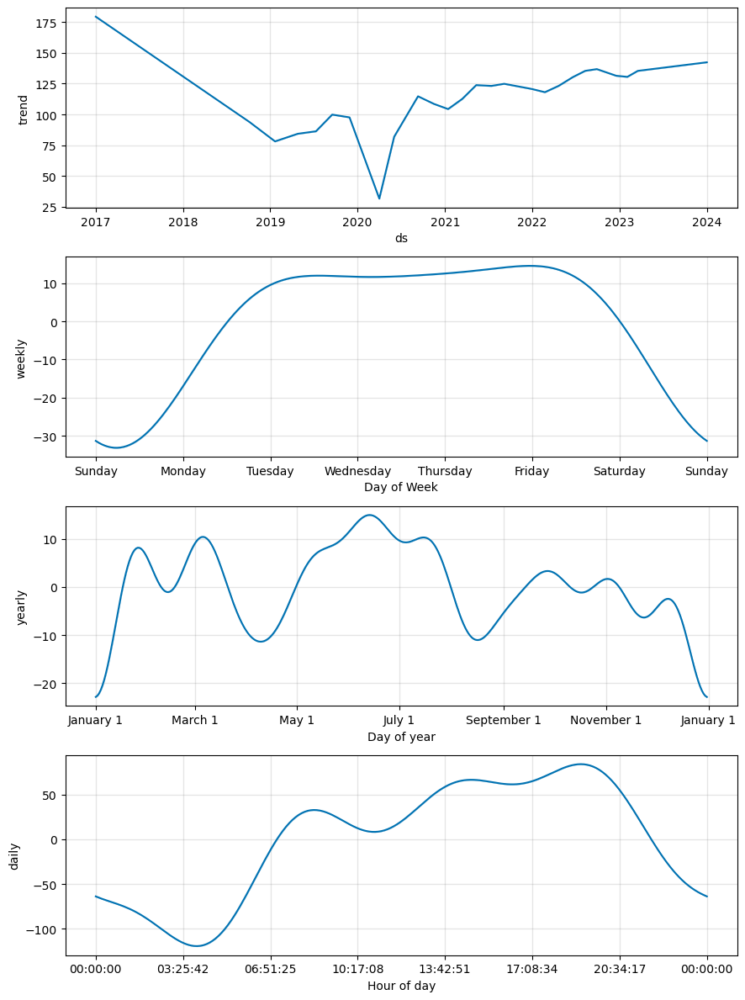

In [23]:
#I want to plot it without the forecast
# Filter out the forecast for 2024
forecast_filtered = forecast[forecast['ds'].dt.year < 2024]

# Plot the components without the forecast for 2024
fig2 = m.plot_components(forecast_filtered)

In [13]:
# plot_plotly(m, forecast)

In [14]:
# plot_components_plotly(m, forecast)

### Cross validation model

In [14]:
# Perform cross-validation on the trained model
df_cv = cross_validation(
    m, 
    initial='730 days',    # Use the first 2 years for initial training
    period='180 days',     # Retrain every 6 months
    horizon='365 days'     # Predict the next 1 year after training
)

# Evaluate the performance
df_performance = performance_metrics(df_cv)
print(df_performance)

  0%|          | 0/9 [00:00<?, ?it/s]

18:18:00 - cmdstanpy - INFO - Chain [1] start processing
18:20:04 - cmdstanpy - INFO - Chain [1] done processing


MemoryError: Unable to allocate 9.62 GiB for an array with shape (1000, 1291392) and data type float64

## Save output

In [15]:
if SAVE_OUTPUT:
    df.to_parquet(f'{OUTPUT_DATA_PATH}/file.parquet')

## Watermark

In [16]:
!python -m pip install watermark --quiet

In [17]:
%load_ext watermark

In [18]:
%watermark

Last updated: 2024-11-03T19:00:19.248020+01:00

Python implementation: CPython
Python version       : 3.11.9
IPython version      : 8.25.0

Compiler    : MSC v.1938 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : AMD64 Family 25 Model 68 Stepping 1, AuthenticAMD
CPU cores   : 16
Architecture: 64bit



In [19]:
%watermark --iversions

pandas: 2.0.3
plotly: 5.22.0
numpy : 1.24.4



In [20]:
!lsb_release -a

"lsb_release" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.
